<a href="https://colab.research.google.com/github/Subuktageen-Farooqi/giki_bootcamp_2025/blob/main/bootcamp_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install retina-face insightface opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.5/439.5 kB 30.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 90.7 MB/s eta 0:00:00
  Created wheel for insightface: filename=insightface-0.7.3-cp312-cp312-linux_x86_64.whl size=1070074 sha256=6fe6078e40b0b17d301099aca1098c62b13a838f2b4d075e1a31d98f00eacec5
  Stored in directory: /root/.cache/pip/wheels/73/3c/e2/6d4815e8a8b33a2006554d65ce0d1f973e768f4c7a222fa675
Successfully built insightface


In [ ]:
from retinaface import RetinaFace

# Detect faces
img_path_1 = "/content/drive/MyDrive/BootcampProject/group_photo.jpg"
img_path_2 = "/content/drive/MyDrive/BootcampProject/group_photoo.jpg"
detections_1 = RetinaFace.detect_faces(img_path_1)
detections_2 = RetinaFace.detect_faces(img_path_2)

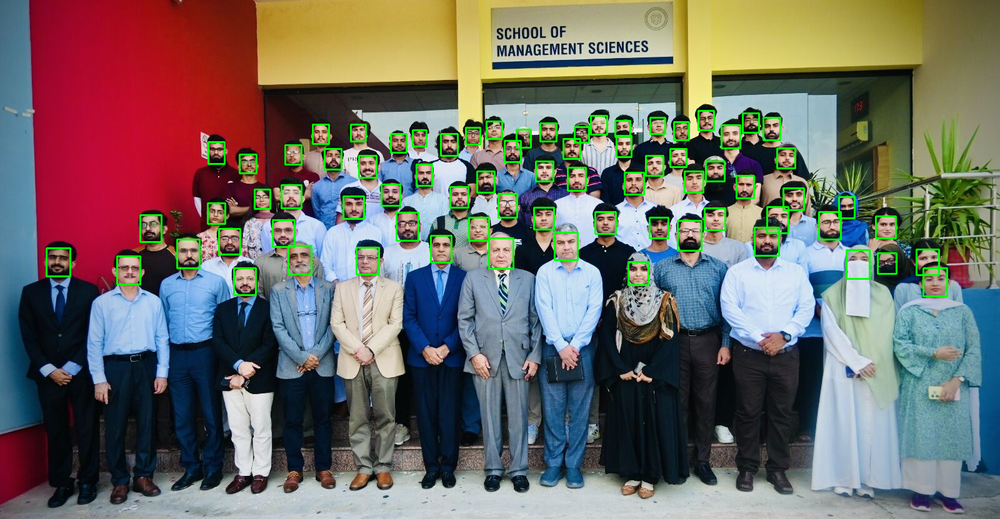

74

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img_1 = cv2.imread(img_path_1)
face_count = 0
for face, attr in detections_1.items():
    box = attr["facial_area"]   # bounding box
    landmarks = attr["landmarks"]  # eyes, nose, mouth
    x1, y1, x2, y2 = map(int, box)
    img_1 = cv2.rectangle(img_1, (x1,y1), (x2,y2), (0,255,0), 2)
    #print("Face found at:", box)
    face_count += 1
cv2_imshow(img_1)
face_count

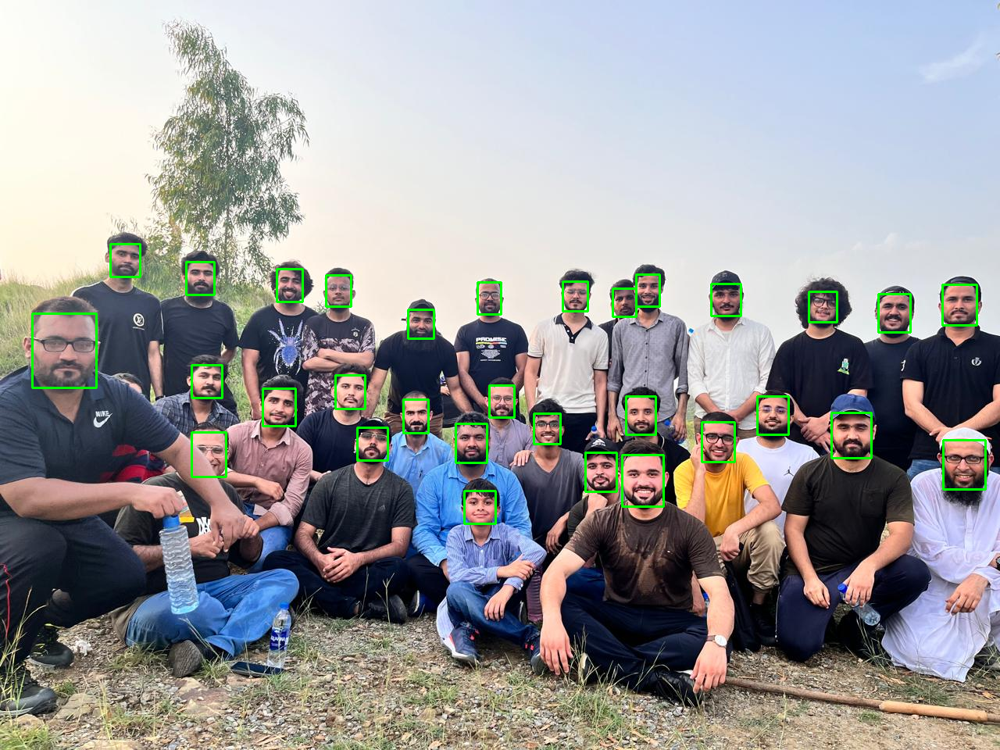

31

In [ ]:
#import cv2
#from google.colab.patches import cv2_imshow

img_2 = cv2.imread(img_path_2)
face_count = 0
for face, attr in detections_2.items():
    box = attr["facial_area"]   # bounding box
    landmarks = attr["landmarks"]  # eyes, nose, mouth
    x1, y1, x2, y2 = map(int, box)
    img_2 = cv2.rectangle(img_2, (x1,y1), (x2,y2), (0,255,0), 2)
    #print("Face found at:", box)
    face_count += 1
cv2_imshow(img_2)
face_count

In [ ]:
!pip install onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 101.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 11.4 MB/s eta 0:00:00


In [ ]:
import os
print("\n".join(os.listdir("/content/drive/MyDrive/BootcampProject/")))

bootcamp_project.ipynb
Kamal_Akhtar.mp4
William_Osman.mp4
Mudassir.mp4
Muhammad_Farhan.mp4
Qasim.mp4
Huzaifa.mp4
Kazim.mp4
Muhammad_Abbas.mp4
Iftikhar_Ali.mp4
Umair.mp4
Lucky.mp4
VID-20250826-WA0016.mp4
Muhammad_Shehryar.mp4
Naveed_.mp4
Muhammad_Asif.mp4
Muhammad_Kashif.mp4
Usama_Shafiq.mp4
Raja_Hadeed.mp4
Umar.mp4
Muhammad_Tayyab.mp4
NaikAmal_khan.mp4
Sajeel.mp4
Muhammad_Rayyan.mp4
Muhammad_Saboor.mp4
Muhammad_Mujeeb.mp4
group_photo.jpg
Copy of group_photo.jpg
group_photoo.jpg


In [ ]:
from insightface.app import FaceAnalysis
import numpy as np
import cv2

# Init ArcFace model
app = FaceAnalysis(name="buffalo_l")
app.prepare(ctx_id=0, det_size=(640,640))

# Check if detection model is loaded
assert 'detection' in app.models, "Detection model not loaded. Please check the model name and installation."


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


In [ ]:
import pickle, os, cv2, numpy as np

DB_FILE = "face_db.pkl"

# ---------- helpers ----------
def load_face_db():
    return pickle.load(open(DB_FILE, "rb")) if os.path.exists(DB_FILE) else {}

def save_face_db(face_db):
    pickle.dump(face_db, open(DB_FILE, "wb"))

# ---------- embedding extractor ----------
def extract_avg_embedding(video_path, step_frames=20):
    cap = cv2.VideoCapture(video_path)
    embeddings = []
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    step = max(frame_count // step_frames, 1)

    i = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret: break
        if i % step == 0:
            faces = app.get(frame)
            if faces:
                embeddings.append(faces[0].normed_embedding)
        i += 1
    cap.release()

    if embeddings:
        return np.mean(embeddings, axis=0)  # average embedding
    return None

# ---------- build DB from scratch ----------
def build_face_db(video_dir):
    face_db = {}
    for file in os.listdir(video_dir):
        if not file.lower().endswith((".mp4", ".avi", ".mov")):
            continue
        label = os.path.splitext(file)[0]
        video_path = os.path.join(video_dir, file)
        avg_emb = extract_avg_embedding(video_path)
        if avg_emb is not None:
            face_db[label] = avg_emb
            print(f"Added {label} (new DB)")
    save_face_db(face_db)
    return face_db

# ---------- update DB with only new videos ----------
def update_face_db(face_db, video_dir):
    existing = set(face_db.keys())
    for file in os.listdir(video_dir):
        if not file.lower().endswith((".mp4", ".avi", ".mov")):
            continue
        label = os.path.splitext(file)[0]
        if label in existing:  # skip already in DB
            continue
        video_path = os.path.join(video_dir, file)
        avg_emb = extract_avg_embedding(video_path)
        if avg_emb is not None:
            face_db[label] = avg_emb
            print(f"Added {label} (update)")
    save_face_db(face_db)
    return face_db

# ---------- main ----------
video_dir = "/content/drive/MyDrive/BootcampProject/"

if os.path.exists(DB_FILE):
    face_db = load_face_db()
    face_db = update_face_db(face_db, video_dir)
else:
    face_db = build_face_db(video_dir)

print("Database ready with:", list(face_db.keys()))

Added Kamal_Akhtar (new DB)
Added William_Osman (new DB)
Added Mudassir (new DB)
Added Muhammad_Farhan (new DB)
Added Qasim (new DB)
Added Huzaifa (new DB)
Added Kazim (new DB)
Added Muhammad_Abbas (new DB)
Added Iftikhar_Ali (new DB)
Added Umair (new DB)
Added Lucky (new DB)
Added hafiz molana (new DB)
Added Muhammad_Shehryar (new DB)
Added Naveed_ (new DB)
Added Muhammad_Asif (new DB)
Added Muhammad_Kashif (new DB)
Added Usama_Shafiq (new DB)
Added Raja_Hadeed (new DB)
Added Umar (new DB)
Added Muhammad_Tayyab (new DB)
Added NaikAmal_khan (new DB)
Added Sajeel (new DB)
Added Muhammad_Rayyan (new DB)
Added Muhammad_Saboor (new DB)
Added Muhammad_Mujeeb (new DB)
Database ready with: ['Kamal_Akhtar', 'William_Osman', 'Mudassir', 'Muhammad_Farhan', 'Qasim', 'Huzaifa', 'Kazim', 'Muhammad_Abbas', 'Iftikhar_Ali', 'Umair', 'Lucky', 'hafiz molana', 'Muhammad_Shehryar', 'Naveed_', 'Muhammad_Asif', 'Muhammad_Kashif', 'Usama_Shafiq', 'Raja_Hadeed', 'Umar', 'Muhammad_Tayyab', 'NaikAmal_khan', 'Sa

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

def recognize_face(embedding, db, threshold=0.6):
    best_match, best_score = "Unknown", -1
    for name, db_emb in db.items():
        if db_emb is None: continue
        score = cosine_similarity([embedding], [db_emb])[0][0]
        if score > best_score:
            best_match, best_score = name, score
    return (best_match if best_score >= threshold else "Unknown", best_score)

In [ ]:
def draw_results(image, faces, face_db):
    for f in faces:
        emb = f.normed_embedding
        name, conf = recognize_face(emb, face_db)

        x1, y1, x2, y2 = map(int, f.bbox)
        cv2.rectangle(image, (x1,y1), (x2,y2), (0,255,0), 2)
        if name != "Unknown":
          cv2.putText(image, f"{name} {conf:.2f}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,0), 2)
    return image

In [ ]:
import matplotlib.pyplot as plt

def show_faces_cropped(image, faces, face_db):
    crops, labels = [], []
    for f in faces:
        x1, y1, x2, y2 = map(int, f.bbox)
        crop = image[y1:y2, x1:x2]   # crop face
        emb = f.normed_embedding
        name, conf = recognize_face(emb, face_db)
        crops.append(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))  # convert BGR→RGB
        labels.append(f"{name}\n({conf:.2f})")

    n = len(crops)
    cols = min(5, n)  # up to 5 per row
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, 3*rows))
    axes = axes.flatten()

    for i in range(len(crops)):
        axes[i].imshow(crops[i])
        axes[i].set_title(labels[i])
        axes[i].axis("off")

    # Hide any empty subplots
    for j in range(len(crops), len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()


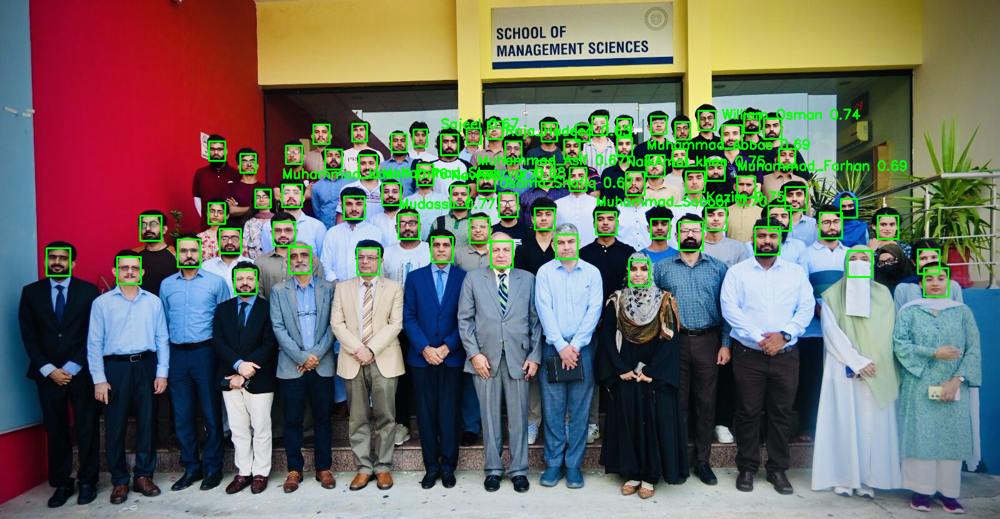

Detected: Unknown (confidence 0.17)
Detected: Unknown (confidence 0.06)
Detected: Unknown (confidence 0.17)
Detected: Unknown (confidence 0.23)
Detected: Unknown (confidence 0.27)
Detected: Unknown (confidence 0.16)
Detected: Unknown (confidence 0.23)
Detected: Unknown (confidence 0.09)
Detected: Unknown (confidence 0.24)
Detected: Unknown (confidence 0.29)
Detected: Muhammad_Saboor (confidence 0.70)
Detected: Unknown (confidence 0.19)
Detected: Unknown (confidence 0.16)
Detected: Unknown (confidence 0.14)
Detected: Unknown (confidence 0.18)
Detected: Unknown (confidence 0.15)
Detected: Unknown (confidence 0.19)
Detected: Unknown (confidence 0.19)
Detected: Unknown (confidence 0.10)
Detected: Unknown (confidence 0.26)
Detected: Unknown (confidence 0.12)
Detected: Unknown (confidence 0.17)
Detected: Unknown (confidence 0.07)
Detected: Unknown (confidence 0.10)
Detected: Muhammad_Shehryar (confidence 0.68)
Detected: Unknown (confidence 0.23)
Detected: Muhammad_Kashif (confidence 0.76)
De

In [33]:
# test_1
test_img_path_1 = "/content/drive/MyDrive/BootcampProject/group_photo.jpg"
# Use cv2.VideoCapture to read the image, which can be more reliable with Google Drive paths
cap = cv2.VideoCapture(test_img_path_1)
ret, img = cap.read()
cap.release()

from google.colab.patches import cv2_imshow

if ret:
    faces = app.get(img)
    img_dtct_1 = draw_results(img, faces, face_db)
    cv2_imshow(img_dtct_1)
    for f in faces:
        embedding = f.normed_embedding  # 512-dim vector
        name, conf = recognize_face(embedding, face_db, 0.6)
        print(f"Detected: {name} (confidence {conf:.2f})")
else:
    print(f"Error reading image from {test_img_path_1}")

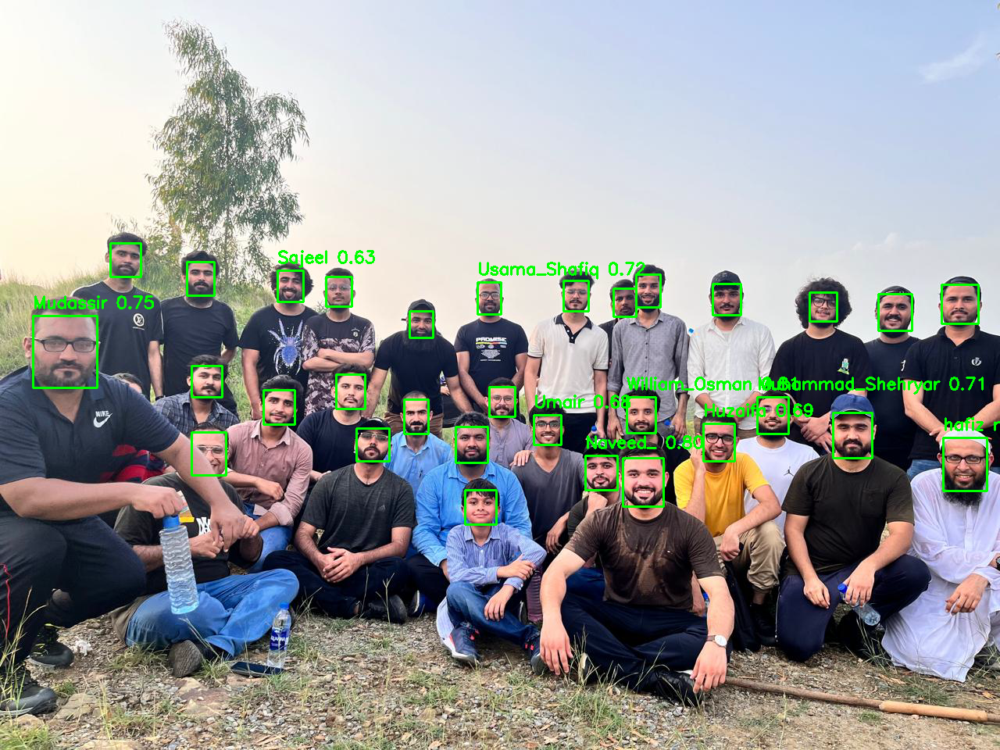

Detected: hafiz molana (confidence 0.68)
Detected: Unknown (confidence 0.19)
Detected: Unknown (confidence 0.20)
Detected: Unknown (confidence 0.13)
Detected: Unknown (confidence 0.20)
Detected: Huzaifa (confidence 0.69)
Detected: Umair (confidence 0.68)
Detected: William_Osman (confidence 0.81)
Detected: Unknown (confidence 0.19)
Detected: Naveed_ (confidence 0.80)
Detected: Unknown (confidence 0.13)
Detected: Unknown (confidence 0.08)
Detected: Unknown (confidence 0.23)
Detected: Mudassir (confidence 0.75)
Detected: Unknown (confidence 0.17)
Detected: Unknown (confidence 0.58)
Detected: Sajeel (confidence 0.63)
Detected: Unknown (confidence 0.12)
Detected: Unknown (confidence 0.29)
Detected: Muhammad_Shehryar (confidence 0.71)
Detected: Unknown (confidence 0.13)
Detected: Unknown (confidence 0.19)
Detected: Unknown (confidence 0.21)
Detected: Unknown (confidence 0.18)
Detected: Unknown (confidence 0.25)
Detected: Unknown (confidence 0.29)
Detected: Unknown (confidence 0.15)
Detected:

In [34]:
# test_2
test_img_path_2 = "/content/drive/MyDrive/BootcampProject/group_photoo.jpg"
# Use cv2.VideoCapture to read the image, which can be more reliable with Google Drive paths
cap = cv2.VideoCapture(test_img_path_2)
ret, img = cap.read()
cap.release()

from google.colab.patches import cv2_imshow

if ret:
    faces = app.get(img)
    img_dtct_2 = draw_results(img, faces, face_db)
    cv2_imshow(img_dtct_2)
    for f in faces:
        embedding = f.normed_embedding  # 512-dim vector
        name, conf = recognize_face(embedding, face_db, 0.6)
        print(f"Detected: {name} (confidence {conf:.2f})")
else:
    print(f"Error reading image from {test_img_path_2}")

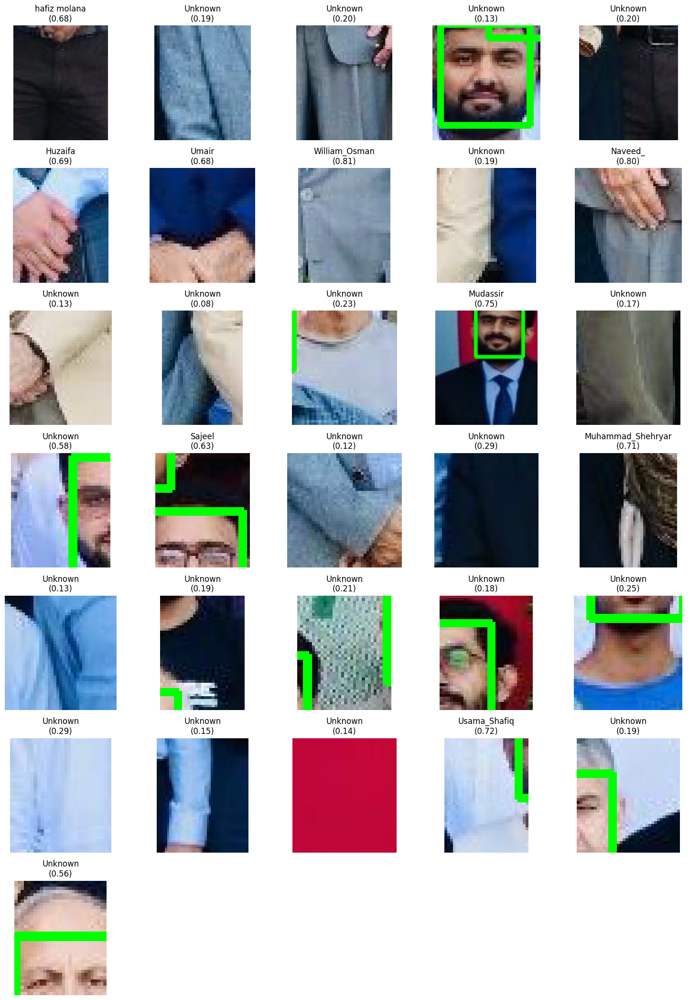

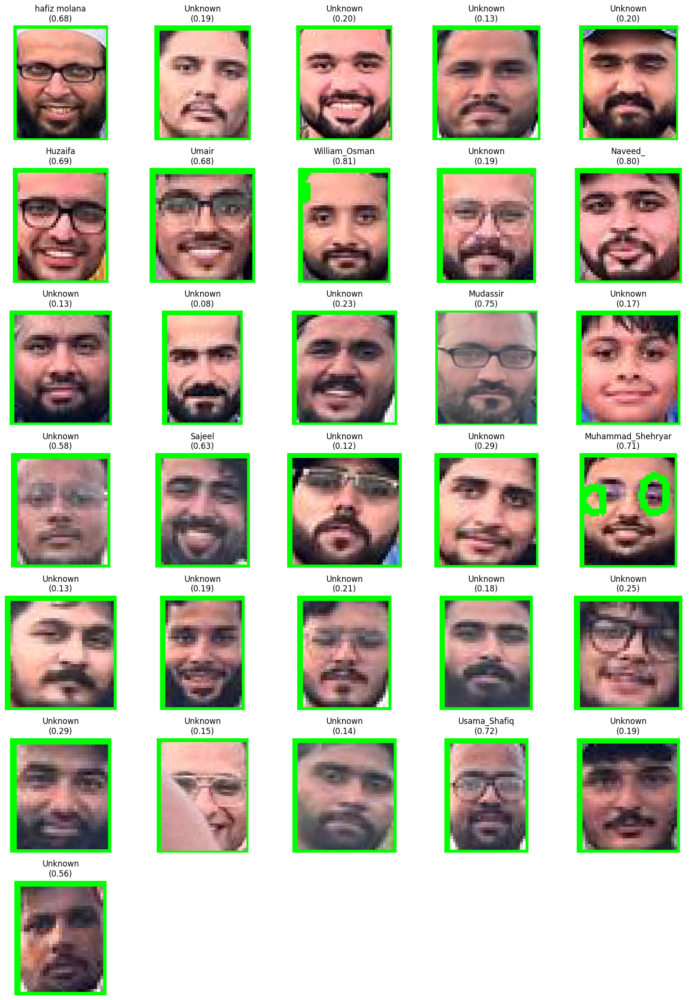

In [35]:
show_faces_cropped(img, faces, face_db)
show_faces_cropped(img_dtct_2, faces, face_db)